In [ ]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 720 kB 5.2 MB/s 
     |████████████████████████████████| 1.2 MB 27.7 MB/s 
     |████████████████████████████████| 186 kB 45.5 MB/s 
     |████████████████████████████████| 46 kB 3.7 MB/s 
     |████████████████████████████████| 56 kB 4.0 MB/s 
     |████████████████████████████████| 51 kB 305 kB/s 
Mounted at /content/gdrive


In [ ]:
from fastai.vision.all import *
from fastbook import *
from fastai.vision.data import *
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path='/content/drive/MyDrive/SID/train'

In [ ]:
import torch
import torch.nn.functional as F
from torch.autograd import Variable
import numpy as np
from math import exp

def gaussian(window_size, sigma):
    gauss = torch.Tensor([exp(-(x - window_size//2)**2/float(2*sigma**2)) for x in range(window_size)])
    return gauss/gauss.sum()

def create_window(window_size, channel):
    _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
    _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
    window = Variable(_2D_window.expand(channel, 1, window_size, window_size).contiguous())
    return window

def _ssim(img1, img2, window, window_size, channel, size_average = True):
    mu1 = F.conv2d(img1, window, padding = window_size//2, groups = channel)
    mu2 = F.conv2d(img2, window, padding = window_size//2, groups = channel)

    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1*mu2

    sigma1_sq = F.conv2d(img1*img1, window, padding = window_size//2, groups = channel) - mu1_sq
    sigma2_sq = F.conv2d(img2*img2, window, padding = window_size//2, groups = channel) - mu2_sq
    sigma12 = F.conv2d(img1*img2, window, padding = window_size//2, groups = channel) - mu1_mu2

    C1 = 0.01**2
    C2 = 0.03**2

    ssim_map = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))/((mu1_sq + mu2_sq + C1)*(sigma1_sq + sigma2_sq + C2))

    if size_average:
        return ssim_map.mean()
    else:
        return ssim_map.mean(1).mean(1).mean(1)

class SSIM(torch.nn.Module):
    def __init__(self, window_size = 11, size_average = True):
        super(SSIM, self).__init__()
        self.window_size = window_size
        self.size_average = size_average
        self.channel = 1
        self.window = create_window(window_size, self.channel)

    def forward(self, img1, img2):
        (_, channel, _, _) = img1.size()

        if channel == self.channel and self.window.data.type() == img1.data.type():
            window = self.window
        else:
            window = create_window(self.window_size, channel)
            
            if img1.is_cuda:
                window = window.cuda(img1.get_device())
            window = window.type_as(img1)
            
            self.window = window
            self.channel = channel


        return _ssim(img1, img2, window, self.window_size, channel, self.size_average)


def ssim(img1, img2, window_size = 11, size_average = True):
    (_, channel, _, _) = img1.size()
    window = create_window(window_size, channel)
    
    if img1.is_cuda:
        window = window.cuda(img1.get_device())
    window = window.type_as(img1)
    
    return _ssim(img1, img2, window, window_size, channel, size_average)

In [ ]:
np_gt=cv2.imread('/content/drive/MyDrive/SID/train/long/30/3.jpg')
np_in=cv2.imread('/content/drive/MyDrive/SID/train/short/0.1/3.jpg')

In [ ]:
tsr_gt=torch.from_numpy(np.rollaxis(np_gt,2)).float().unsqueeze(0)/255.0
tsr_in=torch.from_numpy(np.rollaxis(np_in,2)).float().unsqueeze(0)/255.0

In [ ]:
import matplotlib.pyplot as plt
def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)), interpolation='nearest')

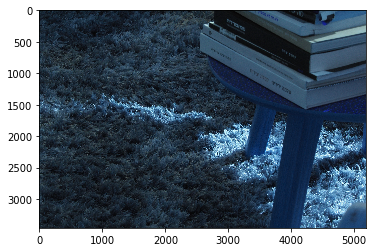

In [ ]:
show(tsr_gt.data[0])

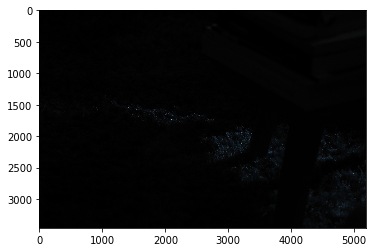

In [ ]:
show(tsr_in.data[0])

In [ ]:
if torch.cuda.is_available():
    tsr_gt = tsr_gt.cuda()
    tsr_in = tsr_in.cuda()

In [ ]:
tsr_gt = Variable(tsr_gt, requires_grad=False)
tsr_in = Variable(tsr_in, requires_grad = True)

In [ ]:
ssim_value = ssim(tsr_gt, tsr_in)
print("Initial ssim:", ssim_value)

Initial ssim: tensor(0.0745, device='cuda:0', grad_fn=<MeanBackward0>)


In [ ]:
ssim_loss = SSIM()

In [ ]:
from torch import optim
optimizer = optim.Adam([tsr_in], lr=0.01)

tensor(0.0745, device='cuda:0', grad_fn=<NegBackward>)
tensor(0.1790, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.2722, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.3532, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.4236, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.4845, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.5371, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.5827, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.6227, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.6583, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.6902, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.7190, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.7447, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.7677, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.7882, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8066, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8231, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8379, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8513, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8634, device='cuda:0', grad_fn=<NegBackward>)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8742, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8841, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8929, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9010, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9083, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9149, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9209, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9263, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9313, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9358, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9400, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9437, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9472, device='cuda:0', grad_fn=<NegBackward>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9504, device='cuda:0', grad_fn=<NegBackward>)


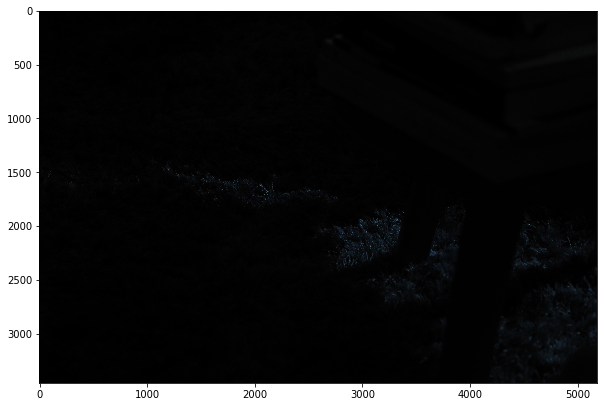

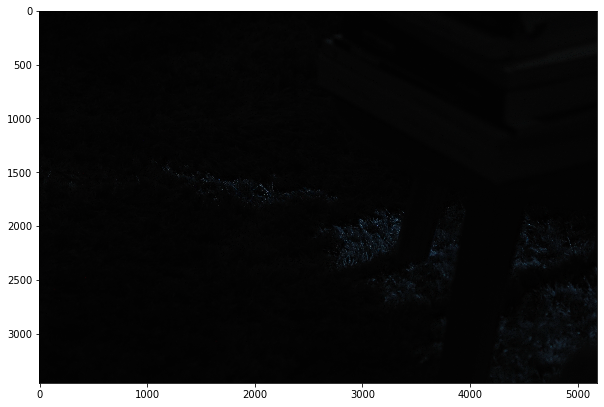

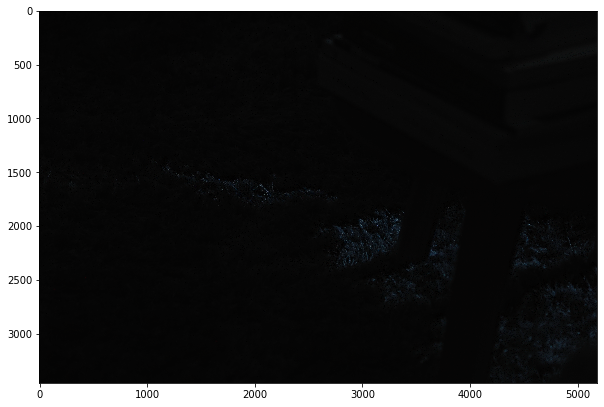

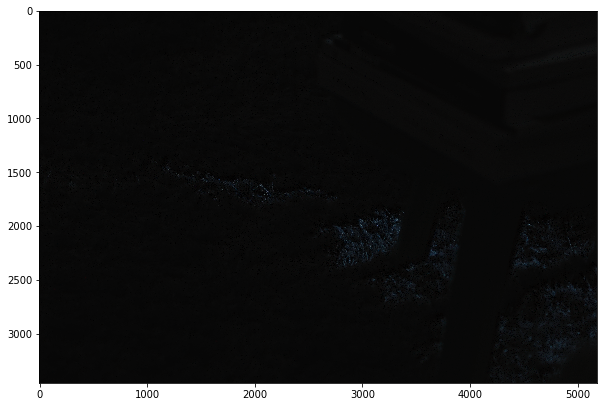

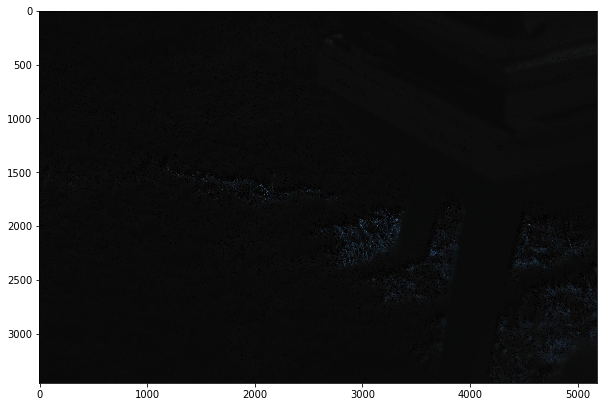

...

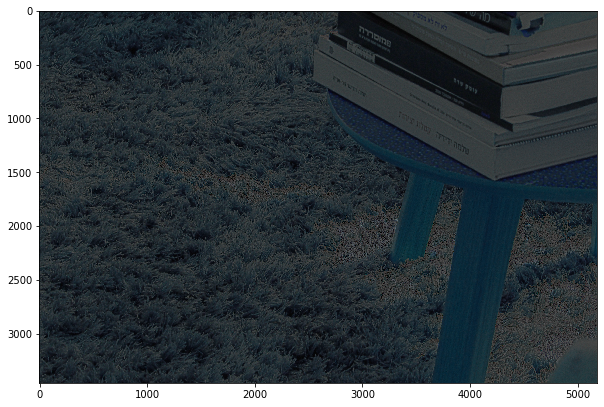

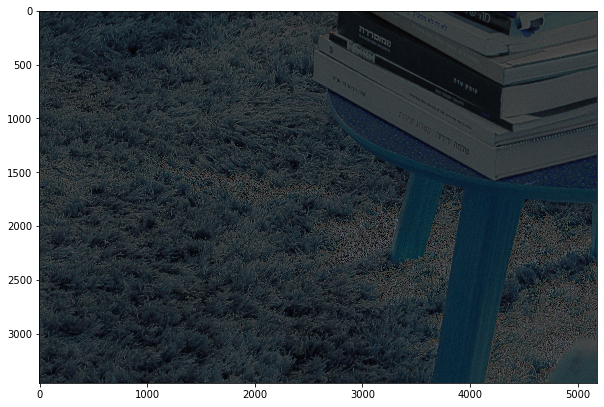

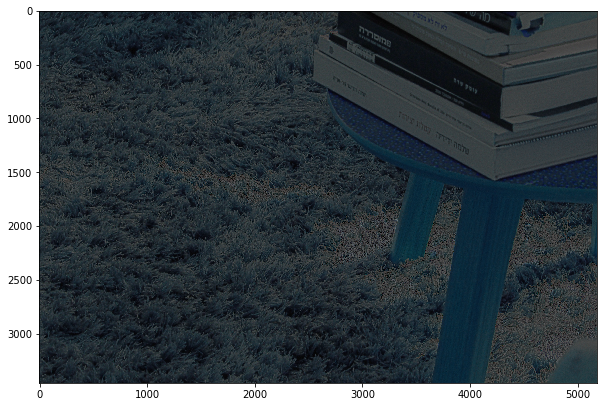

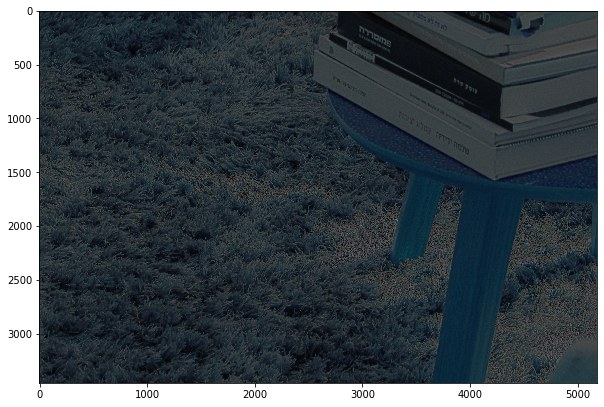

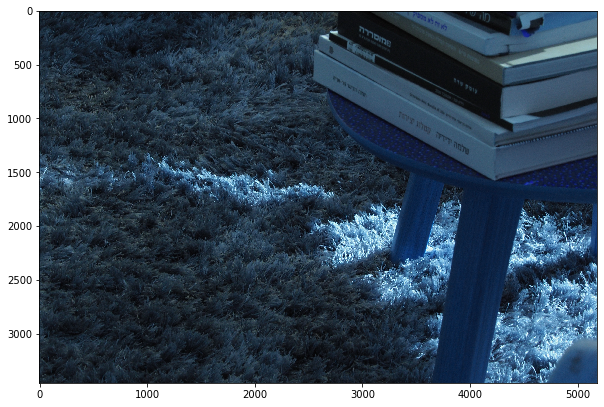

In [ ]:
while ssim_value < 0.95:
    optimizer.zero_grad()
    ssim_out =- ssim_loss(tsr_gt, tsr_in)
    ssim_value =- ssim_out
    print(ssim_value)
    plt.figure(figsize=(10,10))
    show(tsr_in.data[0])
    ssim_out.backward()
    optimizer.step()
show(tsr_gt.data[0])